In [1]:
import torch
import torch.backends.cudnn as cudnn
import torchvision
import cv2 
from matplotlib import pyplot as plt
import os,glob,sys
from tqdm import tqdm
import numpy as np
import PIL
import random
from PIL import Image
import h5py
from typing import Generator
import gc,json 
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"  # Arrange GPU devices starting from 0
os.environ["CUDA_VISIBLE_DEVICES"]= "0,2"  # Set the GPU 1 to use
from core.data_loader import sem_generator,patch_generator, load_whole_image
from core.crop_image import scale_f_num_0to3,crop_image, make_image_crop
from core.utils import seed_everything
from core.patch_generate import *

In [2]:
seed_everything(0) # Seed 고정

In [3]:
# load whole image[size : (2048, 3072)] in "whole_images" 
data_path = "Samsung_SNU"
num_per_Ffolder = 16
# whole_images = load_whole_image(data_path,num_per_Ffolder)

In [12]:
def generate_top_bottom_crop_image(data_path : str,generator : Generator[str,str,np.array],save=True):
    for img in generator:
        set_num, f_num, image_num = img[:3]
        save_dir = os.path.join(data_path+"_1536x3072",set_num)
        os.makedirs(save_dir,exist_ok=True)
        #print(save_dir)
        img = img[-1][256:-256,:]
        #print(img.shape) # (1536, 3072)
        #plt.imshow(img,cmap='gray')
        file_name = f"{f_num}_{image_num}.png"
        file_path = os.path.join(save_dir,file_name)
        if save is True:
            cv2.imwrite(file_path,img)

In [17]:
# crop top_bottom image

In [18]:

!rm -r ./Samsung_SNU_1536x3072/*
!ls ./Samsung_SNU_1536x3072

gen = sem_generator(data_path)
generate_top_bottom_crop_image(data_path,gen)

In [20]:
!ls Samsung_SNU_1536x3072/SET1/F16_1.png

Samsung_SNU_1536x3072/SET1/F16_1.png


In [4]:
!tree Samsung_SNU_1536x3072 | tail -n 1
!tree Samsung_SNU_1536x3072/SET1 | tail -n 1
!tree Samsung_SNU_1536x3072/SET2 | tail -n 1
!tree Samsung_SNU_1536x3072/SET3 | tail -n 1
!tree Samsung_SNU_1536x3072/SET4 | tail -n 1
"""
expected output
4 directories, 256 files
0 directories, 64 files
0 directories, 64 files
0 directories, 64 files
0 directories, 64 files
"""

4 directories, 256 files
0 directories, 64 files
0 directories, 64 files
0 directories, 64 files
0 directories, 64 files


'\nexpected output\n4 directories, 256 files\n0 directories, 64 files\n0 directories, 64 files\n0 directories, 64 files\n0 directories, 64 files\n'

In [5]:
# below related to making patch

In [6]:
data_path="./Samsung_SNU_1536x3072"
crop_data_path="./Samsung_SNU_cropped"
os.makedirs(crop_data_path,exist_ok=True)
#random_crop = torchvision.transforms.RandomCrop(size=256)
crop_size = 256
num_crop= 2#500

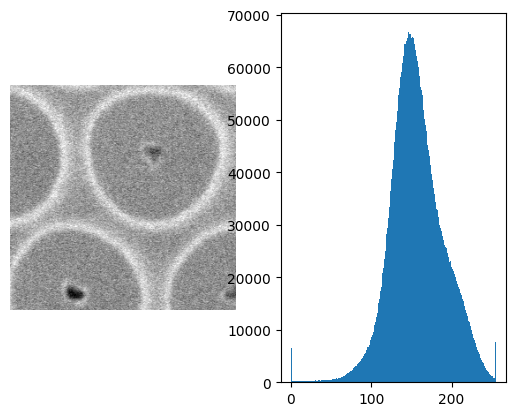

In [7]:
""" 3,4
211 , 2392 , -5 , 19
371 , 166 , -5 , 19
"""
crop_size=256
image = "./Samsung_SNU_1536x3072/SET1/F64_8.png"
top, left, v_shift, h_shift = 211 , 2392 , -5 , 19
whole_img = cv2.imread('./Samsung_SNU_1536x3072/SET1/F64_8.png',cv2.IMREAD_GRAYSCALE)
p = whole_img[top:top+crop_size,left:left+crop_size]
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(p,cmap='gray')
plt.subplot(1,2,2)
bins = np.linspace(0,255,256)
plt.hist(whole_img.flatten(),bins)
print("")

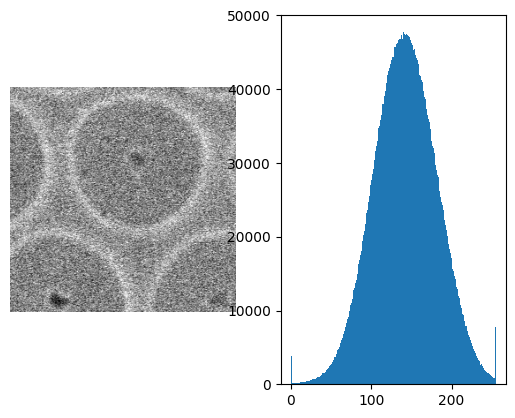

In [8]:
""" 3,4
211 , 2392 , -5 , 19
371 , 166 , -5 , 19
"""
crop_size=256
image = "./Samsung_SNU_1536x3072/SET1/F8_8.png"
top, left, v_shift, h_shift = 211 , 2392 , -5 , 19
whole_img = cv2.imread('./Samsung_SNU_1536x3072/SET1/F8_8.png',cv2.IMREAD_GRAYSCALE)
p = whole_img[top:top+crop_size,left:left+crop_size]
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(p,cmap='gray')
plt.subplot(1,2,2)
bins = np.linspace(0,255,256)
plt.hist(whole_img.flatten(),bins)
print("")

In [5]:
## make align information
# per set, takes 12 min
data_path="./Samsung_SNU_1536x3072"
shift_info = {}
show_log = True
for device_id,set_num in enumerate(sorted(os.listdir(data_path))):
    shift_info[f"SET{device_id+1}"] = {}
    set_path = os.path.join(data_path,set_num)
    noisy_f_num = ['F8','F16','F32']
    
    for i,f_num in enumerate(noisy_f_num): # f_num 마다 구분
        for image_idx, image_path in tqdm(enumerate(sorted(glob.glob(f"{set_path}/{f_num}*.png")))):
            #print(image_path)
            image_num = image_path.split("_")[-1]
            clean_path = os.path.join(data_path,set_num,f"F64_{image_num}")
            if show_log is True : 
                print(image_path, clean_path)
            
            im = cv2.imread(image_path,cv2.IMREAD_GRAYSCALE)
            target_im = cv2.imread(clean_path,cv2.IMREAD_GRAYSCALE)
            
            v_shift, h_shift = get_shift_info(im, target_im)
            shift_info[f"SET{device_id+1}"][image_path] = {'v_shift' : v_shift, 'h_shift' : h_shift}
            if show_log is True:
                print( v_shift,h_shift)
    with open(f'shift_info_{device_id+1}.txt', 'w') as f:
        f.write(json.dumps(shift_info,indent="\t"))
    print(f"write to shift_info_{device_id+1}.txt complete")

0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET1/F8_1.png ./Samsung_SNU_1536x3072/SET1/F64_1.png


1it [00:14, 14.89s/it]

5 -8
./Samsung_SNU_1536x3072/SET1/F8_10.png ./Samsung_SNU_1536x3072/SET1/F64_10.png


2it [00:29, 14.80s/it]

1 -13
./Samsung_SNU_1536x3072/SET1/F8_11.png ./Samsung_SNU_1536x3072/SET1/F64_11.png


3it [00:44, 14.90s/it]

-2 -12
./Samsung_SNU_1536x3072/SET1/F8_12.png ./Samsung_SNU_1536x3072/SET1/F64_12.png


4it [00:59, 14.95s/it]

7 -10
./Samsung_SNU_1536x3072/SET1/F8_13.png ./Samsung_SNU_1536x3072/SET1/F64_13.png


5it [01:14, 14.87s/it]

5 -12
./Samsung_SNU_1536x3072/SET1/F8_14.png ./Samsung_SNU_1536x3072/SET1/F64_14.png


6it [01:29, 14.82s/it]

5 -6
./Samsung_SNU_1536x3072/SET1/F8_15.png ./Samsung_SNU_1536x3072/SET1/F64_15.png


7it [01:44, 14.85s/it]

5 -13
./Samsung_SNU_1536x3072/SET1/F8_16.png ./Samsung_SNU_1536x3072/SET1/F64_16.png


8it [01:58, 14.84s/it]

2 -12
./Samsung_SNU_1536x3072/SET1/F8_2.png ./Samsung_SNU_1536x3072/SET1/F64_2.png


9it [02:13, 14.85s/it]

-1 -9
./Samsung_SNU_1536x3072/SET1/F8_3.png ./Samsung_SNU_1536x3072/SET1/F64_3.png


10it [02:28, 14.86s/it]

6 -6
./Samsung_SNU_1536x3072/SET1/F8_4.png ./Samsung_SNU_1536x3072/SET1/F64_4.png


11it [02:43, 14.83s/it]

4 -7
./Samsung_SNU_1536x3072/SET1/F8_5.png ./Samsung_SNU_1536x3072/SET1/F64_5.png


12it [02:58, 14.85s/it]

-11 -13
./Samsung_SNU_1536x3072/SET1/F8_6.png ./Samsung_SNU_1536x3072/SET1/F64_6.png


13it [03:13, 14.89s/it]

-4 -17
./Samsung_SNU_1536x3072/SET1/F8_7.png ./Samsung_SNU_1536x3072/SET1/F64_7.png


14it [03:27, 14.84s/it]

-5 -15
./Samsung_SNU_1536x3072/SET1/F8_8.png ./Samsung_SNU_1536x3072/SET1/F64_8.png


15it [03:42, 14.84s/it]

6 -19
./Samsung_SNU_1536x3072/SET1/F8_9.png ./Samsung_SNU_1536x3072/SET1/F64_9.png


16it [03:57, 14.85s/it]


1 -14


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET1/F16_1.png ./Samsung_SNU_1536x3072/SET1/F64_1.png


1it [00:14, 14.85s/it]

5 -7
./Samsung_SNU_1536x3072/SET1/F16_10.png ./Samsung_SNU_1536x3072/SET1/F64_10.png


2it [00:29, 14.85s/it]

1 -11
./Samsung_SNU_1536x3072/SET1/F16_11.png ./Samsung_SNU_1536x3072/SET1/F64_11.png


3it [00:44, 14.74s/it]

-2 -10
./Samsung_SNU_1536x3072/SET1/F16_12.png ./Samsung_SNU_1536x3072/SET1/F64_12.png


4it [00:59, 14.82s/it]

7 -9
./Samsung_SNU_1536x3072/SET1/F16_13.png ./Samsung_SNU_1536x3072/SET1/F64_13.png


5it [01:14, 14.91s/it]

6 -10
./Samsung_SNU_1536x3072/SET1/F16_14.png ./Samsung_SNU_1536x3072/SET1/F64_14.png


6it [01:29, 14.83s/it]

4 -6
./Samsung_SNU_1536x3072/SET1/F16_15.png ./Samsung_SNU_1536x3072/SET1/F64_15.png


7it [01:43, 14.74s/it]

5 -12
./Samsung_SNU_1536x3072/SET1/F16_16.png ./Samsung_SNU_1536x3072/SET1/F64_16.png


8it [01:58, 14.77s/it]

0 -9
./Samsung_SNU_1536x3072/SET1/F16_2.png ./Samsung_SNU_1536x3072/SET1/F64_2.png


9it [02:13, 14.78s/it]

-3 -9
./Samsung_SNU_1536x3072/SET1/F16_3.png ./Samsung_SNU_1536x3072/SET1/F64_3.png


10it [02:28, 14.83s/it]

6 -6
./Samsung_SNU_1536x3072/SET1/F16_4.png ./Samsung_SNU_1536x3072/SET1/F64_4.png


11it [02:43, 14.84s/it]

3 -7
./Samsung_SNU_1536x3072/SET1/F16_5.png ./Samsung_SNU_1536x3072/SET1/F64_5.png


12it [02:57, 14.86s/it]

-10 -13
./Samsung_SNU_1536x3072/SET1/F16_6.png ./Samsung_SNU_1536x3072/SET1/F64_6.png


13it [03:12, 14.89s/it]

-4 -13
./Samsung_SNU_1536x3072/SET1/F16_7.png ./Samsung_SNU_1536x3072/SET1/F64_7.png


14it [03:27, 14.90s/it]

-5 -14
./Samsung_SNU_1536x3072/SET1/F16_8.png ./Samsung_SNU_1536x3072/SET1/F64_8.png


15it [03:42, 14.90s/it]

5 -15
./Samsung_SNU_1536x3072/SET1/F16_9.png ./Samsung_SNU_1536x3072/SET1/F64_9.png


16it [03:57, 14.85s/it]


2 -11


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET1/F32_1.png ./Samsung_SNU_1536x3072/SET1/F64_1.png


1it [00:15, 15.08s/it]

1 -3
./Samsung_SNU_1536x3072/SET1/F32_10.png ./Samsung_SNU_1536x3072/SET1/F64_10.png


2it [00:30, 15.06s/it]

1 -8
./Samsung_SNU_1536x3072/SET1/F32_11.png ./Samsung_SNU_1536x3072/SET1/F64_11.png


3it [00:45, 15.04s/it]

-2 -4
./Samsung_SNU_1536x3072/SET1/F32_12.png ./Samsung_SNU_1536x3072/SET1/F64_12.png


4it [00:59, 14.92s/it]

4 -7
./Samsung_SNU_1536x3072/SET1/F32_13.png ./Samsung_SNU_1536x3072/SET1/F64_13.png


5it [01:14, 14.79s/it]

5 -7
./Samsung_SNU_1536x3072/SET1/F32_14.png ./Samsung_SNU_1536x3072/SET1/F64_14.png


6it [01:29, 14.93s/it]

3 -6
./Samsung_SNU_1536x3072/SET1/F32_15.png ./Samsung_SNU_1536x3072/SET1/F64_15.png


7it [01:44, 14.93s/it]

4 -8
./Samsung_SNU_1536x3072/SET1/F32_16.png ./Samsung_SNU_1536x3072/SET1/F64_16.png


8it [01:59, 14.82s/it]

0 -6
./Samsung_SNU_1536x3072/SET1/F32_2.png ./Samsung_SNU_1536x3072/SET1/F64_2.png


9it [02:13, 14.80s/it]

-5 -5
./Samsung_SNU_1536x3072/SET1/F32_3.png ./Samsung_SNU_1536x3072/SET1/F64_3.png


10it [02:28, 14.84s/it]

3 -2
./Samsung_SNU_1536x3072/SET1/F32_4.png ./Samsung_SNU_1536x3072/SET1/F64_4.png


11it [02:43, 14.87s/it]

0 -6
./Samsung_SNU_1536x3072/SET1/F32_5.png ./Samsung_SNU_1536x3072/SET1/F64_5.png


12it [02:58, 14.79s/it]

-8 -9
./Samsung_SNU_1536x3072/SET1/F32_6.png ./Samsung_SNU_1536x3072/SET1/F64_6.png


13it [03:12, 14.72s/it]

-3 -9
./Samsung_SNU_1536x3072/SET1/F32_7.png ./Samsung_SNU_1536x3072/SET1/F64_7.png


14it [03:27, 14.76s/it]

-5 -9
./Samsung_SNU_1536x3072/SET1/F32_8.png ./Samsung_SNU_1536x3072/SET1/F64_8.png


15it [03:42, 14.79s/it]

7 -10
./Samsung_SNU_1536x3072/SET1/F32_9.png ./Samsung_SNU_1536x3072/SET1/F64_9.png


16it [03:57, 14.84s/it]


-1 -8
write to shift_info_1.txt complete


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET2/F8_1.png ./Samsung_SNU_1536x3072/SET2/F64_1.png


1it [00:14, 14.97s/it]

9 -10
./Samsung_SNU_1536x3072/SET2/F8_10.png ./Samsung_SNU_1536x3072/SET2/F64_10.png


2it [00:29, 14.98s/it]

14 -13
./Samsung_SNU_1536x3072/SET2/F8_11.png ./Samsung_SNU_1536x3072/SET2/F64_11.png


3it [00:44, 14.90s/it]

11 -14
./Samsung_SNU_1536x3072/SET2/F8_12.png ./Samsung_SNU_1536x3072/SET2/F64_12.png


4it [00:59, 14.87s/it]

19 -15
./Samsung_SNU_1536x3072/SET2/F8_13.png ./Samsung_SNU_1536x3072/SET2/F64_13.png


5it [01:14, 14.90s/it]

14 -16
./Samsung_SNU_1536x3072/SET2/F8_14.png ./Samsung_SNU_1536x3072/SET2/F64_14.png


6it [01:29, 14.86s/it]

14 -11
./Samsung_SNU_1536x3072/SET2/F8_15.png ./Samsung_SNU_1536x3072/SET2/F64_15.png


7it [01:44, 14.80s/it]

10 -13
./Samsung_SNU_1536x3072/SET2/F8_16.png ./Samsung_SNU_1536x3072/SET2/F64_16.png


8it [01:58, 14.83s/it]

16 -12
./Samsung_SNU_1536x3072/SET2/F8_2.png ./Samsung_SNU_1536x3072/SET2/F64_2.png


9it [02:14, 14.93s/it]

15 -13
./Samsung_SNU_1536x3072/SET2/F8_3.png ./Samsung_SNU_1536x3072/SET2/F64_3.png


10it [02:28, 14.87s/it]

16 -13
./Samsung_SNU_1536x3072/SET2/F8_4.png ./Samsung_SNU_1536x3072/SET2/F64_4.png


11it [02:43, 14.98s/it]

17 -10
./Samsung_SNU_1536x3072/SET2/F8_5.png ./Samsung_SNU_1536x3072/SET2/F64_5.png


12it [02:58, 14.96s/it]

17 -21
./Samsung_SNU_1536x3072/SET2/F8_6.png ./Samsung_SNU_1536x3072/SET2/F64_6.png


13it [03:13, 14.93s/it]

23 -19
./Samsung_SNU_1536x3072/SET2/F8_7.png ./Samsung_SNU_1536x3072/SET2/F64_7.png


14it [03:28, 14.85s/it]

19 -17
./Samsung_SNU_1536x3072/SET2/F8_8.png ./Samsung_SNU_1536x3072/SET2/F64_8.png


15it [03:43, 14.81s/it]

18 -17
./Samsung_SNU_1536x3072/SET2/F8_9.png ./Samsung_SNU_1536x3072/SET2/F64_9.png


16it [03:57, 14.87s/it]


14 -16


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET2/F16_1.png ./Samsung_SNU_1536x3072/SET2/F64_1.png


1it [00:14, 14.67s/it]

8 -9
./Samsung_SNU_1536x3072/SET2/F16_10.png ./Samsung_SNU_1536x3072/SET2/F64_10.png


2it [00:29, 14.86s/it]

11 -12
./Samsung_SNU_1536x3072/SET2/F16_11.png ./Samsung_SNU_1536x3072/SET2/F64_11.png


3it [00:44, 14.84s/it]

10 -13
./Samsung_SNU_1536x3072/SET2/F16_12.png ./Samsung_SNU_1536x3072/SET2/F64_12.png


4it [00:59, 14.87s/it]

18 -12
./Samsung_SNU_1536x3072/SET2/F16_13.png ./Samsung_SNU_1536x3072/SET2/F64_13.png


5it [01:14, 14.82s/it]

11 -12
./Samsung_SNU_1536x3072/SET2/F16_14.png ./Samsung_SNU_1536x3072/SET2/F64_14.png


6it [01:28, 14.80s/it]

13 -10
./Samsung_SNU_1536x3072/SET2/F16_15.png ./Samsung_SNU_1536x3072/SET2/F64_15.png


7it [01:43, 14.82s/it]

9 -12
./Samsung_SNU_1536x3072/SET2/F16_16.png ./Samsung_SNU_1536x3072/SET2/F64_16.png


8it [01:58, 14.80s/it]

13 -8
./Samsung_SNU_1536x3072/SET2/F16_2.png ./Samsung_SNU_1536x3072/SET2/F64_2.png


9it [02:13, 14.85s/it]

13 -10
./Samsung_SNU_1536x3072/SET2/F16_3.png ./Samsung_SNU_1536x3072/SET2/F64_3.png


10it [02:28, 14.87s/it]

12 -11
./Samsung_SNU_1536x3072/SET2/F16_4.png ./Samsung_SNU_1536x3072/SET2/F64_4.png


11it [02:42, 14.78s/it]

14 -9
./Samsung_SNU_1536x3072/SET2/F16_5.png ./Samsung_SNU_1536x3072/SET2/F64_5.png


12it [02:57, 14.75s/it]

15 -17
./Samsung_SNU_1536x3072/SET2/F16_6.png ./Samsung_SNU_1536x3072/SET2/F64_6.png


13it [03:12, 14.67s/it]

20 -15
./Samsung_SNU_1536x3072/SET2/F16_7.png ./Samsung_SNU_1536x3072/SET2/F64_7.png


14it [03:26, 14.67s/it]

15 -14
./Samsung_SNU_1536x3072/SET2/F16_8.png ./Samsung_SNU_1536x3072/SET2/F64_8.png


15it [03:41, 14.65s/it]

14 -14
./Samsung_SNU_1536x3072/SET2/F16_9.png ./Samsung_SNU_1536x3072/SET2/F64_9.png


16it [03:56, 14.78s/it]


11 -13


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET2/F32_1.png ./Samsung_SNU_1536x3072/SET2/F64_1.png


1it [00:14, 14.98s/it]

5 -5
./Samsung_SNU_1536x3072/SET2/F32_10.png ./Samsung_SNU_1536x3072/SET2/F64_10.png


2it [00:29, 14.92s/it]

6 -9
./Samsung_SNU_1536x3072/SET2/F32_11.png ./Samsung_SNU_1536x3072/SET2/F64_11.png


3it [00:44, 14.78s/it]

8 -10
./Samsung_SNU_1536x3072/SET2/F32_12.png ./Samsung_SNU_1536x3072/SET2/F64_12.png


4it [00:59, 14.82s/it]

12 -10
./Samsung_SNU_1536x3072/SET2/F32_13.png ./Samsung_SNU_1536x3072/SET2/F64_13.png


5it [01:14, 14.94s/it]

7 -10
./Samsung_SNU_1536x3072/SET2/F32_14.png ./Samsung_SNU_1536x3072/SET2/F64_14.png


6it [01:29, 14.89s/it]

9 -5
./Samsung_SNU_1536x3072/SET2/F32_15.png ./Samsung_SNU_1536x3072/SET2/F64_15.png


7it [01:43, 14.83s/it]

5 -8
./Samsung_SNU_1536x3072/SET2/F32_16.png ./Samsung_SNU_1536x3072/SET2/F64_16.png


8it [01:58, 14.79s/it]

8 -6
./Samsung_SNU_1536x3072/SET2/F32_2.png ./Samsung_SNU_1536x3072/SET2/F64_2.png


9it [02:13, 14.81s/it]

10 -7
./Samsung_SNU_1536x3072/SET2/F32_3.png ./Samsung_SNU_1536x3072/SET2/F64_3.png


10it [02:28, 14.85s/it]

8 -8
./Samsung_SNU_1536x3072/SET2/F32_4.png ./Samsung_SNU_1536x3072/SET2/F64_4.png


11it [02:43, 14.84s/it]

9 -5
./Samsung_SNU_1536x3072/SET2/F32_5.png ./Samsung_SNU_1536x3072/SET2/F64_5.png


12it [02:58, 14.86s/it]

9 -12
./Samsung_SNU_1536x3072/SET2/F32_6.png ./Samsung_SNU_1536x3072/SET2/F64_6.png


13it [03:13, 14.95s/it]

14 -11
./Samsung_SNU_1536x3072/SET2/F32_7.png ./Samsung_SNU_1536x3072/SET2/F64_7.png


14it [03:28, 14.92s/it]

10 -9
./Samsung_SNU_1536x3072/SET2/F32_8.png ./Samsung_SNU_1536x3072/SET2/F64_8.png


15it [03:42, 14.86s/it]

9 -10
./Samsung_SNU_1536x3072/SET2/F32_9.png ./Samsung_SNU_1536x3072/SET2/F64_9.png


16it [03:57, 14.84s/it]


6 -8
write to shift_info_2.txt complete


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET3/F8_1.png ./Samsung_SNU_1536x3072/SET3/F64_1.png


1it [00:14, 14.91s/it]

5 4
./Samsung_SNU_1536x3072/SET3/F8_10.png ./Samsung_SNU_1536x3072/SET3/F64_10.png


2it [00:29, 15.00s/it]

1 2
./Samsung_SNU_1536x3072/SET3/F8_11.png ./Samsung_SNU_1536x3072/SET3/F64_11.png


3it [00:44, 14.98s/it]

-6 -1
./Samsung_SNU_1536x3072/SET3/F8_12.png ./Samsung_SNU_1536x3072/SET3/F64_12.png


4it [00:59, 14.88s/it]

0 1
./Samsung_SNU_1536x3072/SET3/F8_13.png ./Samsung_SNU_1536x3072/SET3/F64_13.png


5it [01:14, 14.87s/it]

-4 1
./Samsung_SNU_1536x3072/SET3/F8_14.png ./Samsung_SNU_1536x3072/SET3/F64_14.png


6it [01:29, 14.85s/it]

-3 1
./Samsung_SNU_1536x3072/SET3/F8_15.png ./Samsung_SNU_1536x3072/SET3/F64_15.png


7it [01:44, 14.82s/it]

3 3
./Samsung_SNU_1536x3072/SET3/F8_16.png ./Samsung_SNU_1536x3072/SET3/F64_16.png


8it [01:58, 14.77s/it]

-4 2
./Samsung_SNU_1536x3072/SET3/F8_2.png ./Samsung_SNU_1536x3072/SET3/F64_2.png


9it [02:13, 14.84s/it]

1 0
./Samsung_SNU_1536x3072/SET3/F8_3.png ./Samsung_SNU_1536x3072/SET3/F64_3.png


10it [02:28, 14.89s/it]

-2 3
./Samsung_SNU_1536x3072/SET3/F8_4.png ./Samsung_SNU_1536x3072/SET3/F64_4.png


11it [02:43, 14.88s/it]

-3 0
./Samsung_SNU_1536x3072/SET3/F8_5.png ./Samsung_SNU_1536x3072/SET3/F64_5.png


12it [02:58, 14.88s/it]

-4 0
./Samsung_SNU_1536x3072/SET3/F8_6.png ./Samsung_SNU_1536x3072/SET3/F64_6.png


13it [03:13, 14.90s/it]

3 1
./Samsung_SNU_1536x3072/SET3/F8_7.png ./Samsung_SNU_1536x3072/SET3/F64_7.png


14it [03:28, 14.84s/it]

-5 0
./Samsung_SNU_1536x3072/SET3/F8_8.png ./Samsung_SNU_1536x3072/SET3/F64_8.png


15it [03:43, 14.88s/it]

-2 1
./Samsung_SNU_1536x3072/SET3/F8_9.png ./Samsung_SNU_1536x3072/SET3/F64_9.png


16it [03:58, 14.89s/it]


-7 -1


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET3/F16_1.png ./Samsung_SNU_1536x3072/SET3/F64_1.png


1it [00:15, 15.04s/it]

3 2
./Samsung_SNU_1536x3072/SET3/F16_10.png ./Samsung_SNU_1536x3072/SET3/F64_10.png


2it [00:29, 14.98s/it]

1 1
./Samsung_SNU_1536x3072/SET3/F16_11.png ./Samsung_SNU_1536x3072/SET3/F64_11.png


3it [00:45, 15.04s/it]

-6 -1
./Samsung_SNU_1536x3072/SET3/F16_12.png ./Samsung_SNU_1536x3072/SET3/F64_12.png


4it [00:59, 14.94s/it]

0 1
./Samsung_SNU_1536x3072/SET3/F16_13.png ./Samsung_SNU_1536x3072/SET3/F64_13.png


5it [01:14, 14.99s/it]

-4 1
./Samsung_SNU_1536x3072/SET3/F16_14.png ./Samsung_SNU_1536x3072/SET3/F64_14.png


6it [01:29, 14.99s/it]

-3 1
./Samsung_SNU_1536x3072/SET3/F16_15.png ./Samsung_SNU_1536x3072/SET3/F64_15.png


7it [01:44, 14.88s/it]

2 2
./Samsung_SNU_1536x3072/SET3/F16_16.png ./Samsung_SNU_1536x3072/SET3/F64_16.png


8it [01:59, 14.89s/it]

-3 2
./Samsung_SNU_1536x3072/SET3/F16_2.png ./Samsung_SNU_1536x3072/SET3/F64_2.png


9it [02:14, 14.91s/it]

-1 0
./Samsung_SNU_1536x3072/SET3/F16_3.png ./Samsung_SNU_1536x3072/SET3/F64_3.png


10it [02:29, 14.92s/it]

-3 1
./Samsung_SNU_1536x3072/SET3/F16_4.png ./Samsung_SNU_1536x3072/SET3/F64_4.png


11it [02:44, 14.89s/it]

-2 0
./Samsung_SNU_1536x3072/SET3/F16_5.png ./Samsung_SNU_1536x3072/SET3/F64_5.png


12it [02:58, 14.85s/it]

-3 -1
./Samsung_SNU_1536x3072/SET3/F16_6.png ./Samsung_SNU_1536x3072/SET3/F64_6.png


13it [03:13, 14.88s/it]

4 2
./Samsung_SNU_1536x3072/SET3/F16_7.png ./Samsung_SNU_1536x3072/SET3/F64_7.png


14it [03:28, 14.90s/it]

-5 0
./Samsung_SNU_1536x3072/SET3/F16_8.png ./Samsung_SNU_1536x3072/SET3/F64_8.png


15it [03:43, 14.90s/it]

-2 0
./Samsung_SNU_1536x3072/SET3/F16_9.png ./Samsung_SNU_1536x3072/SET3/F64_9.png


16it [03:58, 14.91s/it]


-7 -1


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET3/F32_1.png ./Samsung_SNU_1536x3072/SET3/F64_1.png


1it [00:14, 14.89s/it]

2 2
./Samsung_SNU_1536x3072/SET3/F32_10.png ./Samsung_SNU_1536x3072/SET3/F64_10.png


2it [00:29, 14.98s/it]

1 0
./Samsung_SNU_1536x3072/SET3/F32_11.png ./Samsung_SNU_1536x3072/SET3/F64_11.png


3it [00:44, 14.90s/it]

-4 0
./Samsung_SNU_1536x3072/SET3/F32_12.png ./Samsung_SNU_1536x3072/SET3/F64_12.png


4it [00:59, 14.72s/it]

0 -1
./Samsung_SNU_1536x3072/SET3/F32_13.png ./Samsung_SNU_1536x3072/SET3/F64_13.png


5it [01:13, 14.75s/it]

-3 1
./Samsung_SNU_1536x3072/SET3/F32_14.png ./Samsung_SNU_1536x3072/SET3/F64_14.png


6it [01:28, 14.82s/it]

-2 1
./Samsung_SNU_1536x3072/SET3/F32_15.png ./Samsung_SNU_1536x3072/SET3/F64_15.png


7it [01:43, 14.73s/it]

2 2
./Samsung_SNU_1536x3072/SET3/F32_16.png ./Samsung_SNU_1536x3072/SET3/F64_16.png


8it [01:58, 14.83s/it]

-2 3
./Samsung_SNU_1536x3072/SET3/F32_2.png ./Samsung_SNU_1536x3072/SET3/F64_2.png


9it [02:13, 14.86s/it]

-1 0
./Samsung_SNU_1536x3072/SET3/F32_3.png ./Samsung_SNU_1536x3072/SET3/F64_3.png


10it [02:28, 14.83s/it]

-3 0
./Samsung_SNU_1536x3072/SET3/F32_4.png ./Samsung_SNU_1536x3072/SET3/F64_4.png


11it [02:43, 14.91s/it]

-4 0
./Samsung_SNU_1536x3072/SET3/F32_5.png ./Samsung_SNU_1536x3072/SET3/F64_5.png


12it [02:58, 14.88s/it]

-2 -1
./Samsung_SNU_1536x3072/SET3/F32_6.png ./Samsung_SNU_1536x3072/SET3/F64_6.png


13it [03:12, 14.86s/it]

3 2
./Samsung_SNU_1536x3072/SET3/F32_7.png ./Samsung_SNU_1536x3072/SET3/F64_7.png


14it [03:27, 14.78s/it]

-4 0
./Samsung_SNU_1536x3072/SET3/F32_8.png ./Samsung_SNU_1536x3072/SET3/F64_8.png


15it [03:42, 14.74s/it]

-1 0
./Samsung_SNU_1536x3072/SET3/F32_9.png ./Samsung_SNU_1536x3072/SET3/F64_9.png


16it [03:57, 14.82s/it]


-6 -1
write to shift_info_3.txt complete


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET4/F8_1.png ./Samsung_SNU_1536x3072/SET4/F64_1.png


1it [00:14, 14.91s/it]

1 -5
./Samsung_SNU_1536x3072/SET4/F8_10.png ./Samsung_SNU_1536x3072/SET4/F64_10.png


2it [00:29, 14.98s/it]

5 -1
./Samsung_SNU_1536x3072/SET4/F8_11.png ./Samsung_SNU_1536x3072/SET4/F64_11.png


3it [00:44, 14.91s/it]

8 -2
./Samsung_SNU_1536x3072/SET4/F8_12.png ./Samsung_SNU_1536x3072/SET4/F64_12.png


4it [00:59, 14.92s/it]

6 -5
./Samsung_SNU_1536x3072/SET4/F8_13.png ./Samsung_SNU_1536x3072/SET4/F64_13.png


5it [01:14, 14.96s/it]

5 -8
./Samsung_SNU_1536x3072/SET4/F8_14.png ./Samsung_SNU_1536x3072/SET4/F64_14.png


6it [01:29, 14.87s/it]

-1 -4
./Samsung_SNU_1536x3072/SET4/F8_15.png ./Samsung_SNU_1536x3072/SET4/F64_15.png


7it [01:44, 14.84s/it]

11 -1
./Samsung_SNU_1536x3072/SET4/F8_16.png ./Samsung_SNU_1536x3072/SET4/F64_16.png


8it [01:59, 14.84s/it]

12 8
./Samsung_SNU_1536x3072/SET4/F8_2.png ./Samsung_SNU_1536x3072/SET4/F64_2.png


9it [02:14, 14.90s/it]

4 0
./Samsung_SNU_1536x3072/SET4/F8_3.png ./Samsung_SNU_1536x3072/SET4/F64_3.png


10it [02:28, 14.90s/it]

13 -1
./Samsung_SNU_1536x3072/SET4/F8_4.png ./Samsung_SNU_1536x3072/SET4/F64_4.png


11it [02:44, 14.95s/it]

8 -1
./Samsung_SNU_1536x3072/SET4/F8_5.png ./Samsung_SNU_1536x3072/SET4/F64_5.png


12it [02:58, 14.95s/it]

3 2
./Samsung_SNU_1536x3072/SET4/F8_6.png ./Samsung_SNU_1536x3072/SET4/F64_6.png


13it [03:13, 14.94s/it]

3 -5
./Samsung_SNU_1536x3072/SET4/F8_7.png ./Samsung_SNU_1536x3072/SET4/F64_7.png


14it [03:28, 14.93s/it]

12 1
./Samsung_SNU_1536x3072/SET4/F8_8.png ./Samsung_SNU_1536x3072/SET4/F64_8.png


15it [03:44, 15.01s/it]

9 4
./Samsung_SNU_1536x3072/SET4/F8_9.png ./Samsung_SNU_1536x3072/SET4/F64_9.png


16it [03:58, 14.93s/it]


5 0


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET4/F16_1.png ./Samsung_SNU_1536x3072/SET4/F64_1.png


1it [00:14, 14.78s/it]

0 -6
./Samsung_SNU_1536x3072/SET4/F16_10.png ./Samsung_SNU_1536x3072/SET4/F64_10.png


2it [00:29, 14.96s/it]

7 1
./Samsung_SNU_1536x3072/SET4/F16_11.png ./Samsung_SNU_1536x3072/SET4/F64_11.png


3it [00:44, 14.89s/it]

6 -2
./Samsung_SNU_1536x3072/SET4/F16_12.png ./Samsung_SNU_1536x3072/SET4/F64_12.png


4it [00:59, 14.90s/it]

5 -5
./Samsung_SNU_1536x3072/SET4/F16_13.png ./Samsung_SNU_1536x3072/SET4/F64_13.png


5it [01:14, 14.88s/it]

5 -6
./Samsung_SNU_1536x3072/SET4/F16_14.png ./Samsung_SNU_1536x3072/SET4/F64_14.png


6it [01:29, 14.78s/it]

-2 -3
./Samsung_SNU_1536x3072/SET4/F16_15.png ./Samsung_SNU_1536x3072/SET4/F64_15.png


7it [01:43, 14.83s/it]

9 -1
./Samsung_SNU_1536x3072/SET4/F16_16.png ./Samsung_SNU_1536x3072/SET4/F64_16.png


8it [01:58, 14.79s/it]

11 8
./Samsung_SNU_1536x3072/SET4/F16_2.png ./Samsung_SNU_1536x3072/SET4/F64_2.png


9it [02:13, 14.85s/it]

3 -1
./Samsung_SNU_1536x3072/SET4/F16_3.png ./Samsung_SNU_1536x3072/SET4/F64_3.png


10it [02:28, 14.87s/it]

7 -3
./Samsung_SNU_1536x3072/SET4/F16_4.png ./Samsung_SNU_1536x3072/SET4/F64_4.png


11it [02:43, 14.79s/it]

3 -4
./Samsung_SNU_1536x3072/SET4/F16_5.png ./Samsung_SNU_1536x3072/SET4/F64_5.png


12it [02:57, 14.76s/it]

2 2
./Samsung_SNU_1536x3072/SET4/F16_6.png ./Samsung_SNU_1536x3072/SET4/F64_6.png


13it [03:12, 14.76s/it]

3 -4
./Samsung_SNU_1536x3072/SET4/F16_7.png ./Samsung_SNU_1536x3072/SET4/F64_7.png


14it [03:27, 14.74s/it]

10 1
./Samsung_SNU_1536x3072/SET4/F16_8.png ./Samsung_SNU_1536x3072/SET4/F64_8.png


15it [03:42, 14.79s/it]

8 3
./Samsung_SNU_1536x3072/SET4/F16_9.png ./Samsung_SNU_1536x3072/SET4/F64_9.png


16it [03:57, 14.82s/it]


3 -1


0it [00:00, ?it/s]

./Samsung_SNU_1536x3072/SET4/F32_1.png ./Samsung_SNU_1536x3072/SET4/F64_1.png


1it [00:14, 14.61s/it]

0 -1
./Samsung_SNU_1536x3072/SET4/F32_10.png ./Samsung_SNU_1536x3072/SET4/F64_10.png


2it [00:29, 14.77s/it]

4 1
./Samsung_SNU_1536x3072/SET4/F32_11.png ./Samsung_SNU_1536x3072/SET4/F64_11.png


3it [00:44, 14.88s/it]

0 -4
./Samsung_SNU_1536x3072/SET4/F32_12.png ./Samsung_SNU_1536x3072/SET4/F64_12.png


4it [00:59, 14.95s/it]

7 -1
./Samsung_SNU_1536x3072/SET4/F32_13.png ./Samsung_SNU_1536x3072/SET4/F64_13.png


5it [01:14, 15.05s/it]

4 -2
./Samsung_SNU_1536x3072/SET4/F32_14.png ./Samsung_SNU_1536x3072/SET4/F64_14.png


6it [01:29, 15.00s/it]

1 -1
./Samsung_SNU_1536x3072/SET4/F32_15.png ./Samsung_SNU_1536x3072/SET4/F64_15.png


7it [01:44, 14.91s/it]

2 -3
./Samsung_SNU_1536x3072/SET4/F32_16.png ./Samsung_SNU_1536x3072/SET4/F64_16.png


8it [01:59, 14.88s/it]

12 8
./Samsung_SNU_1536x3072/SET4/F32_2.png ./Samsung_SNU_1536x3072/SET4/F64_2.png


9it [02:14, 14.86s/it]

2 0
./Samsung_SNU_1536x3072/SET4/F32_3.png ./Samsung_SNU_1536x3072/SET4/F64_3.png


10it [02:28, 14.80s/it]

7 0
./Samsung_SNU_1536x3072/SET4/F32_4.png ./Samsung_SNU_1536x3072/SET4/F64_4.png


11it [02:43, 14.79s/it]

2 -2
./Samsung_SNU_1536x3072/SET4/F32_5.png ./Samsung_SNU_1536x3072/SET4/F64_5.png


12it [02:58, 14.89s/it]

3 4
./Samsung_SNU_1536x3072/SET4/F32_6.png ./Samsung_SNU_1536x3072/SET4/F64_6.png


13it [03:13, 14.88s/it]

2 -3
./Samsung_SNU_1536x3072/SET4/F32_7.png ./Samsung_SNU_1536x3072/SET4/F64_7.png


14it [03:28, 14.91s/it]

5 1
./Samsung_SNU_1536x3072/SET4/F32_8.png ./Samsung_SNU_1536x3072/SET4/F64_8.png


15it [03:43, 14.84s/it]

5 2
./Samsung_SNU_1536x3072/SET4/F32_9.png ./Samsung_SNU_1536x3072/SET4/F64_9.png


16it [03:58, 14.89s/it]

1 -1
write to shift_info_4.txt complete


In [6]:
shift_info

{'SET1': {'./Samsung_SNU_1536x3072/SET1/F8_1.png': {'v_shift': 5,
   'h_shift': -8},
  './Samsung_SNU_1536x3072/SET1/F8_10.png': {'v_shift': 1, 'h_shift': -13},
  './Samsung_SNU_1536x3072/SET1/F8_11.png': {'v_shift': -2, 'h_shift': -12},
  './Samsung_SNU_1536x3072/SET1/F8_12.png': {'v_shift': 7, 'h_shift': -10},
  './Samsung_SNU_1536x3072/SET1/F8_13.png': {'v_shift': 5, 'h_shift': -12},
  './Samsung_SNU_1536x3072/SET1/F8_14.png': {'v_shift': 5, 'h_shift': -6},
  './Samsung_SNU_1536x3072/SET1/F8_15.png': {'v_shift': 5, 'h_shift': -13},
  './Samsung_SNU_1536x3072/SET1/F8_16.png': {'v_shift': 2, 'h_shift': -12},
  './Samsung_SNU_1536x3072/SET1/F8_2.png': {'v_shift': -1, 'h_shift': -9},
  './Samsung_SNU_1536x3072/SET1/F8_3.png': {'v_shift': 6, 'h_shift': -6},
  './Samsung_SNU_1536x3072/SET1/F8_4.png': {'v_shift': 4, 'h_shift': -7},
  './Samsung_SNU_1536x3072/SET1/F8_5.png': {'v_shift': -11, 'h_shift': -13},
  './Samsung_SNU_1536x3072/SET1/F8_6.png': {'v_shift': -4, 'h_shift': -17},
  './Sa

In [7]:
!rm -r ./Samsung_SNU_1474x3010_aligned
!ls ./Samsung_SNU_1474x3010_aligned

data_path="./Samsung_SNU_1536x3072"
aligned_data_path="./Samsung_SNU_1474x3010_aligned"
os.makedirs(aligned_data_path,exist_ok=True)

pad = 31
import json
for set_num in sorted(os.listdir(data_path)):
    print(f"====== {set_num}======")
    shift_info = {}
    with open(f"shift_info_{set_num[-1]}.txt",'r') as f:
        shift_info = json.load(f)
        #print(shift_info[set_num].keys())
    set_path = os.path.join(data_path,set_num)
    aligned_set_path = os.path.join(aligned_data_path,set_num)
    os.makedirs(aligned_set_path,exist_ok=True)
    shift_info = shift_info[set_num]
    #print(shift_info[set_path+"/F8_14.png"])
    for file_name in sorted(os.listdir(set_path)):
        if "checkpoints" in file_name :
            continue
        img_path = os.path.join(set_path,file_name)
        save_path = os.path.join(aligned_data_path,set_num,file_name)
        img = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)
        
        print(f"{file_name} save path : {save_path}")
        if "F64" in file_name :
            padded_img = img[pad:-pad,pad:-pad]
            assert padded_img.shape == (1474,3010)
            cv2.imwrite(save_path,padded_img)
            print(file_name, padded_img.shape)
            continue
        file_path = os.path.join(set_path,file_name)
        v_shift, h_shift = shift_info[file_path].values()
        file_num = file_name.split("_")[-1].split(".")[0]
        padded_img = img[pad+v_shift:-pad+v_shift:,pad+h_shift:-pad+h_shift]
        assert padded_img.shape == (1474,3010)
        print(file_name,v_shift, h_shift,padded_img.shape)
        #print(shift_info[file_path])
        # plt.imshow(clean_img,cmap='gray')
        cv2.imwrite(save_path,padded_img)
        
        #break
        
    #break
print("complete align")

ls: cannot access './Samsung_SNU_1474x3010_aligned': No such file or directory
====== SET1======
F16_1.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_1.png
F16_1.png 5 -7 (1474, 3010)
F16_10.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_10.png
F16_10.png 1 -11 (1474, 3010)
F16_11.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_11.png
F16_11.png -2 -10 (1474, 3010)
F16_12.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_12.png
F16_12.png 7 -9 (1474, 3010)
F16_13.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_13.png
F16_13.png 6 -10 (1474, 3010)
F16_14.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_14.png
F16_14.png 4 -6 (1474, 3010)
F16_15.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_15.png
F16_15.png 5 -12 (1474, 3010)
F16_16.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_16.png
F16_16.png 0 -9 (1474, 3010)
F16_2.png save path : ./Samsung_SNU_1474x3010_aligned/SET1/F16_2.png
F16_2.png -3 -9 (1474, 3010)
F16

In [8]:
shift_info = {}
with open(f"shift_info_{set_num[-1]}.txt",'r') as f:
    shift_info = json.load(f)
f8_8 = cv2.imread('./Samsung_SNU_1474x3010_aligned/SET1/F8_8.png',cv2.IMREAD_GRAYSCALE)
f8_8_before = cv2.imread('./Samsung_SNU_1536x3072/SET1/F8_8.png',cv2.IMREAD_GRAYSCALE)
f64_8 = cv2.imread('./Samsung_SNU_1474x3010_aligned/SET1/F64_8.png',cv2.IMREAD_GRAYSCALE)
f64_8_before = cv2.imread('./Samsung_SNU_1536x3072/SET1/F64_8.png',cv2.IMREAD_GRAYSCALE)
shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']

{'v_shift': 6, 'h_shift': -19}

In [18]:
v_shift, h_shift = get_shift_info(f8_8_before, f64_8_before,log=True)

original ssim (whole) : 0.034743512874180385, psnr : 14.225812471549528
original ssim (patch): 0.030568992911273893, psnr : 14.242794156031104
{'ssim': 0.09399695923798351, 'psnr': 15.786449470024746, 'v_shift': 6, 'h_shift': -20}
{'ssim': 0.09213567036602474, 'psnr': 15.818983072833602, 'v_shift': 6, 'h_shift': -19}


In [19]:
shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']

{'v_shift': 6, 'h_shift': -19}

(0, 0)


/tmp/ipykernel_123901/3798039707.py:27: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(im[top:top+crop_size,left:left+crop_size],cmap='gray')
/tmp/ipykernel_123901/3798039707.py:27: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(im[top:top+crop_size,left:left+crop_size],cmap='gray')


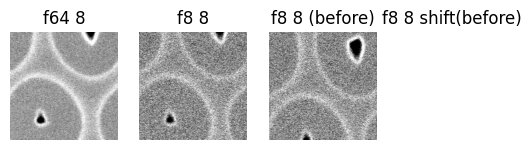

In [26]:
pad = 31
top = 100
left = 100
crop_size = 200

plt.subplot(1,4,1)
plt.axis('off')
plt.title('f64 8')
plt.imshow(f64_8[top:top+crop_size,left:left+crop_size],cmap='gray')
plt.subplot(1,4,2)
plt.axis('off')
plt.title('f8 8')
plt.imshow(f8_8[top:top+crop_size,left:left+crop_size],cmap='gray')
plt.subplot(1,4,3)
plt.axis('off')
plt.title('f8 8 (before)')
plt.imshow(f8_8_before[top:top+crop_size,left:left+crop_size],cmap='gray')
plt.subplot(1,4,4)
plt.axis('off')
plt.title('f8 8 shift')
v_shift += shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']['v_shift']
h_shift += shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']['h_shift']
#top += v_shift
#left += h_shift
im = f8_8_before[pad+v_shift:-pad+v_shift,pad+h_shift:-pad+h_shift]
print(im.shape)
plt.imshow(im[top:top+crop_size,left:left+crop_size],cmap='gray')

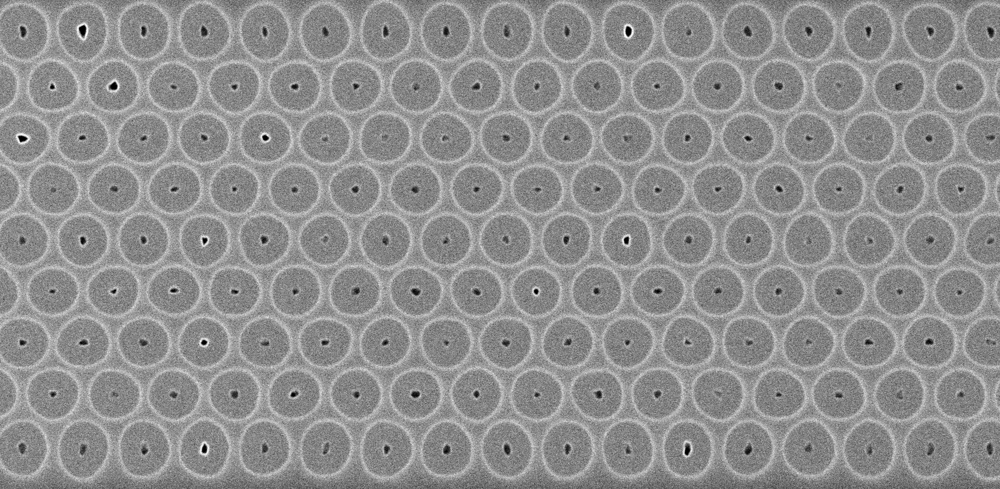

In [11]:
PIL.Image.fromarray(f8_8)

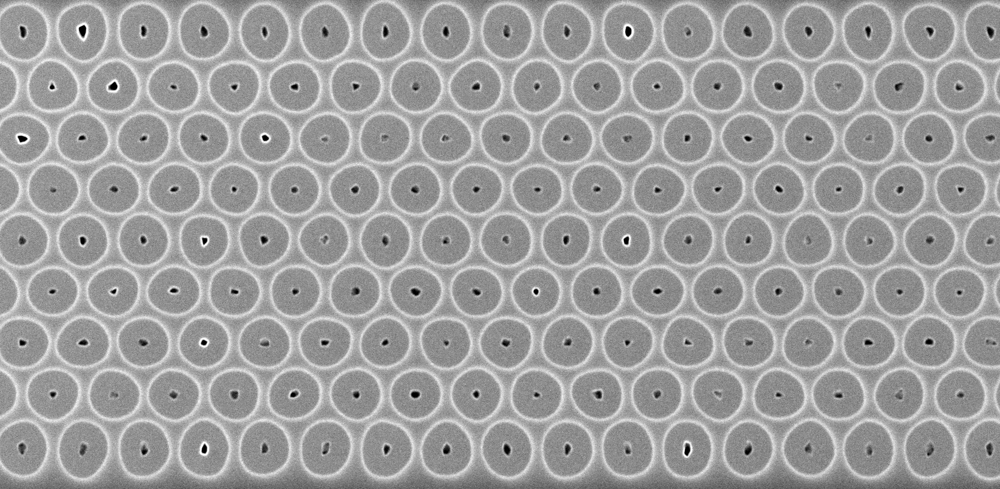

In [12]:
PIL.Image.fromarray(f64_8[-v_shift:,h_shift:])

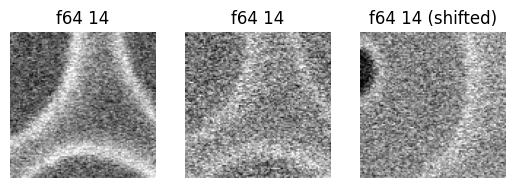

In [16]:

top = 100
left = 100
crop_size = 100

plt.subplot(1,3,1)
plt.axis('off')
plt.title('f64 14')
plt.imshow(f64_8[top:top+crop_size,left:left+crop_size],cmap='gray')
plt.subplot(1,3,2)
plt.axis('off')
plt.title('f64 14')
plt.imshow(f8_8[top:top+crop_size,left:left+crop_size],cmap='gray')
plt.subplot(1,3,3)
plt.axis('off')
plt.title('f64 14 (shifted)')
top += shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']['v_shift']
left += shift_info['SET1']['./Samsung_SNU_1536x3072/SET1/F8_8.png']['h_shift']
plt.imshow(f8_8_before[top:top+crop_size,left:left+crop_size],cmap='gray')